# Network Clustering - Lab

## Introduction

In this lab you'll practice your clustering and visualization skills to investigate stackoverflow! Specifically, the dataset you'll be investigating examines tags on stackoverflow. With this, you should be able to explore some of the related technologies currently in use by developers.

## Objectives
You will be able to:

* Implement network clustering with k-clique clustering
* Implement network clustering with the Girvan-Newman algorithm
* Visualize clusters

## Load the Dataset

Load the dataset from the `stack-overflow-tag-network/stack_network_links.csv` file. For now, simply load the file as a standard pandas DataFrame.

In [1]:
#Your code here
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import networkx as nx
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('stack-overflow-tag-network/stack_network_links.csv')
df.head()

,source,target,value
0,azure,.net,20.933192
1,sql-server,.net,32.322524
2,asp.net,.net,48.407030
3,entity-framework,.net,24.370903
4,wpf,.net,32.350925


## Transform the Dataset into a Network Graph using NetworkX

Transform the dataset from a Pandas DataFrame into a NetworkX graph.

In [3]:
#Your code here
G = nx.Graph()

edges = []
for x in range(len(df)):
    edges.append((df.loc[x,'source'], df.loc[x,'target'],
                  {'weight':df.loc[x,'value']}))

G.add_edges_from(edges)

## Create an Initial Graph Visualization

Next, create an initial visualization of the network.

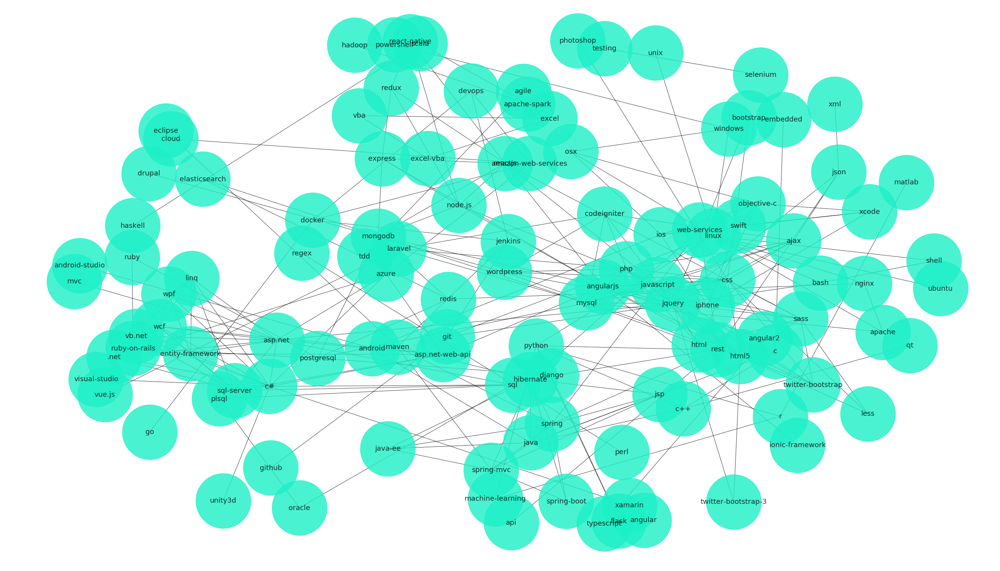

In [4]:
#Your code here
plt.figure(figsize=(35,20))
nx.draw(G, with_labels=True, pos=nx.spring_layout(G, k=2, seed=1), alpha=.8, 
        node_color="#1cf0c7", node_size=20000, font_size=18);

## Perform an Initial Clustering using k-clique Clustering

Begin to explore the impact of using different values of k.

In [5]:
#Your code here
k_clus_2 = nx.algorithms.community.k_clique_communities(G, 2)
for clus in k_clus_2:
    print(clus)

frozenset({'android', 'mysql', 'photoshop', 'reactjs', 'html', 'spring', 'bootstrap', 'entity-framework', 'vb.net', 'rest', 'java', 'asp.net', 'plsql', 'codeigniter', 'drupal', 'angularjs', 'ionic-framework', 'twitter-bootstrap', 'twitter-bootstrap-3', 'wordpress', 'cloud', 'docker', 'matlab', 'linux', 'hibernate', '.net', 'objective-c', 'asp.net-web-api', 'javascript', 'wpf', 'oracle', 'c++', 'spring-mvc', 'angular', 'json', 'swift', 'postgresql', 'ruby-on-rails', 'spring-boot', 'unity3d', 'less', 'qt', 'sql-server', 'embedded', 'jquery', 'react-native', 'linq', 'maven', 'devops', 'shell', 'angular2', 'ruby', 'windows', 'jsp', 'osx', 'laravel', 'node.js', 'flask', 'r', 'redux', 'c#', 'mvc', 'python', 'iphone', 'html5', 'bash', 'ubuntu', 'machine-learning', 'git', 'redis', 'web-services', 'mongodb', 'java-ee', 'wcf', 'eclipse', 'powershell', 'xamarin', 'vue.js', 'android-studio', 'amazon-web-services', 'azure', 'sass', 'ajax', 'xcode', 'api', 'elasticsearch', 'jenkins', 'sql', 'visual-

In [6]:
k_clus_3 = nx.algorithms.community.k_clique_communities(G, 3)
for clus in k_clus_3:
    print(clus)

frozenset({'laravel', 'mysql', 'javascript', 'reactjs', 'node.js', 'html', 'sass', 'bootstrap', 'ajax', 'json', 'redux', 'less', 'codeigniter', 'jquery', 'html5', 'react-native', 'angularjs', 'twitter-bootstrap', 'twitter-bootstrap-3', 'php', 'wordpress', 'mongodb', 'express', 'css'})
frozenset({'asp.net-web-api', 'sql-server', 'sql', 'wpf', 'azure', 'linq', 'entity-framework', 'vb.net', 'wcf', 'asp.net', '.net', 'c#'})
frozenset({'spring', 'web-services', 'java-ee', 'spring-mvc', 'maven', 'rest', 'java', 'hibernate', 'spring-boot', 'jsp'})
frozenset({'c', 'python', 'java', 'c++'})
frozenset({'sql', 'oracle', 'plsql'})
frozenset({'devops', 'docker', 'jenkins', 'amazon-web-services'})
frozenset({'linux', 'osx', 'windows'})
frozenset({'linux', 'apache', 'nginx'})
frozenset({'shell', 'bash', 'linux', 'git'})
frozenset({'osx', 'iphone', 'ios', 'xcode', 'swift', 'objective-c'})
frozenset({'excel-vba', 'excel', 'vba'})
frozenset({'hadoop', 'apache-spark', 'scala'})
frozenset({'ruby', 'postgr

In [7]:
k_clus_4 = nx.algorithms.community.k_clique_communities(G, 4)
for clus in k_clus_4:
    print(clus)

frozenset({'laravel', 'mysql', 'javascript', 'reactjs', 'node.js', 'html', 'sass', 'ajax', 'redux', 'less', 'codeigniter', 'jquery', 'html5', 'react-native', 'angularjs', 'twitter-bootstrap', 'php', 'wordpress', 'mongodb', 'express', 'css'})
frozenset({'asp.net-web-api', 'sql-server', 'sql', 'wpf', 'azure', 'linq', 'entity-framework', 'vb.net', 'wcf', 'asp.net', '.net', 'c#'})
frozenset({'spring', 'java-ee', 'spring-mvc', 'maven', 'java', 'hibernate', 'spring-boot', 'jsp'})
frozenset({'hibernate', 'spring', 'rest', 'web-services'})
frozenset({'xcode', 'iphone', 'swift', 'ios', 'objective-c'})


In [8]:
for k in range(2, 10):
    k_clusters = list(nx.algorithms.community.k_clique_communities(G, k=k))
    print('For k={}: {} clusters'.format(k, len(k_clusters)))

For k=2: 6 clusters
For k=3: 16 clusters
For k=4: 5 clusters
For k=5: 5 clusters
For k=6: 3 clusters
For k=7: 2 clusters
For k=8: 0 clusters
For k=9: 0 clusters


## Visualize The Clusters Produced from the K-Clique Algorithm

> **Level-Up:** Experiment with different `nx.draw()` settings. See the [draw documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html) for a full list. Some recommended settings that you've previewed include the position parameter `pos`, `with_labels=True`, `node_color`, `alpha`, `node_size`, `font_weight` and `font_size`. Note that `nx.spring_layout(G)` is particularly useful for laying out a well formed network. With this, you can pass in parameters for the relative edge distance via `k` and set a `random_seed` to have reproducible results as in `nx.spring_layout(G, k=2.66, seed=10)`. For more details, see the [spring_layout documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.layout.spring_layout.html?highlight=spring%20layout#networkx.drawing.layout.spring_layout).

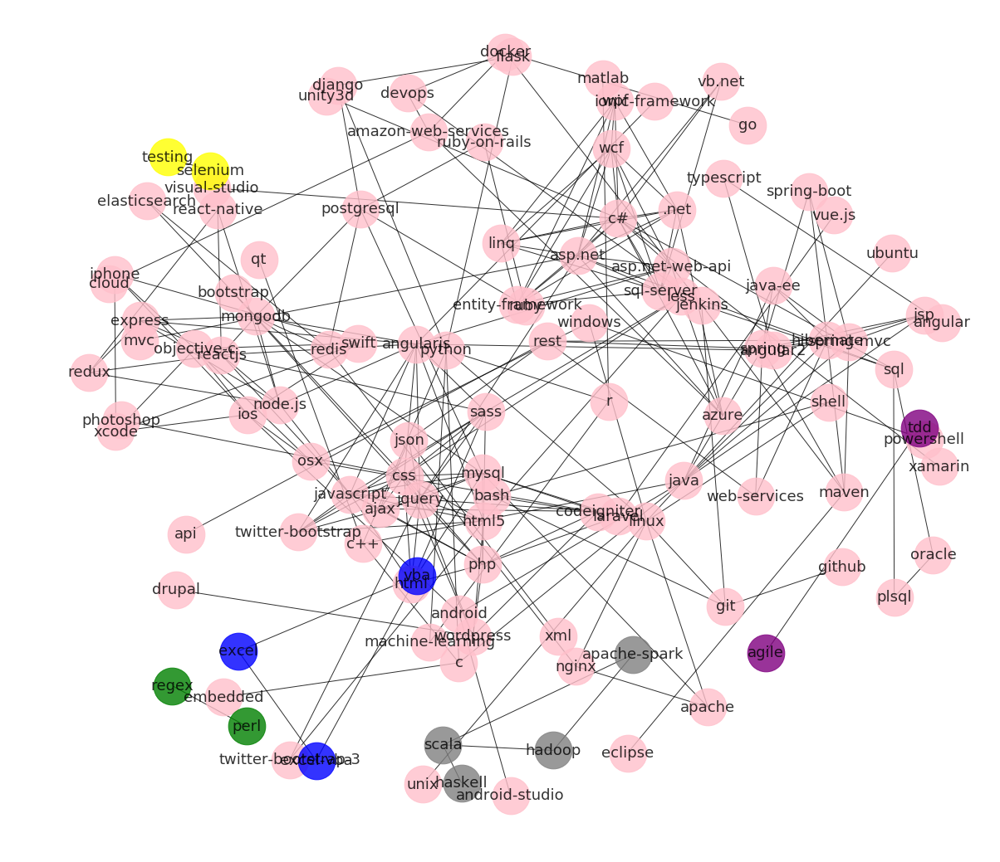

In [16]:
k_clus_2 = nx.algorithms.community.k_clique_communities(G, k=2)
colors = ['pink', 'purple', 'green', 'gray', 'blue', 'yellow']

fig = plt.figure(figsize=(16,14))
for n, cluster in enumerate(k_clus_2):
    cluster = G.subgraph(cluster)
    nx.draw(cluster, pos=nx.spring_layout(G, k=2, seed=10), with_labels=True,
            node_color=colors[n%len(colors)], alpha=0.8, node_size=2000,
            font_size=18);

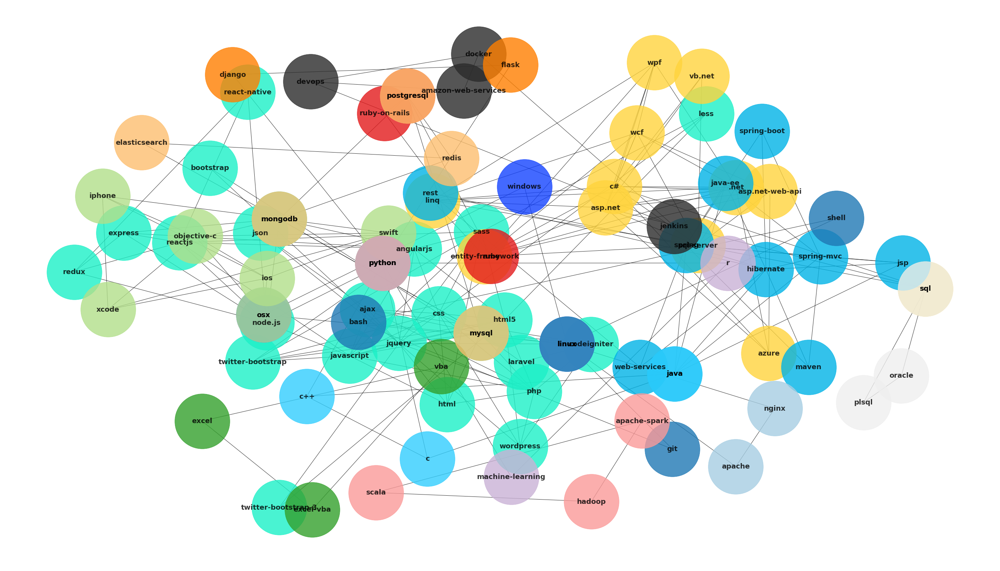

In [17]:
k_clus_3 = list(nx.algorithms.community.k_clique_communities(G, k=3))
colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef","#2b2b2b", "#1443ff",
          "#a6cee3","#1f78b4","#b2df8a","#33a02c","#fb9a99","#e31a1c",
          "#fdbf6f","#ff7f00","#cab2d6","#6a3d9a","#ffff99","#b15928"]
fig = plt.figure(figsize=(35,20))
for n, ci in enumerate(k_clus_3):
    ci = G.subgraph(ci)
    nx.draw(ci, pos=nx.spring_layout(G, k=2.5, seed=10), with_labels=True, node_color=colors[n],
            alpha=.8, node_size=20000, font_weight="bold", font_size=18)

## Perform an Alternative Clustering Using the Girvan-Newman Algorithm

Recluster the network using the Girvan-Newman algorithm. Remember that this will give you a list of cluster lists corresponding to the clusters that form from removing the top n edges according to some metric, typically edge betweenness.

In [19]:
gn_clus = list(nx.algorithms.community.centrality.girvan_newman(G))
gn_clus[:5]

[({'.net',
   'asp.net',
   'asp.net-web-api',
   'azure',
   'c#',
   'entity-framework',
   'linq',
   'mvc',
   'oracle',
   'plsql',
   'sql',
   'sql-server',
   'unity3d',
   'vb.net',
   'visual-studio',
   'wcf',
   'wpf',
   'xamarin'},
  {'agile', 'tdd'},
  {'ajax',
   'amazon-web-services',
   'android',
   'android-studio',
   'angular',
   'angular2',
   'angularjs',
   'apache',
   'api',
   'bash',
   'bootstrap',
   'c',
   'c++',
   'cloud',
   'codeigniter',
   'css',
   'devops',
   'django',
   'docker',
   'drupal',
   'eclipse',
   'elasticsearch',
   'embedded',
   'express',
   'flask',
   'git',
   'github',
   'go',
   'hibernate',
   'html',
   'html5',
   'ionic-framework',
   'ios',
   'iphone',
   'java',
   'java-ee',
   'javascript',
   'jenkins',
   'jquery',
   'json',
   'jsp',
   'laravel',
   'less',
   'linux',
   'machine-learning',
   'matlab',
   'maven',
   'mongodb',
   'mysql',
   'nginx',
   'node.js',
   'objective-c',
   'osx',
   'photosh

In [20]:
for n, clusters in enumerate(gn_clus):
    print('Remove {} edges, get {} clusters'.format(n, len(clusters)))

Remove 0 edges, get 7 clusters
Remove 1 edges, get 8 clusters
Remove 2 edges, get 9 clusters
Remove 3 edges, get 10 clusters
Remove 4 edges, get 11 clusters
Remove 5 edges, get 12 clusters
Remove 6 edges, get 13 clusters
Remove 7 edges, get 14 clusters
Remove 8 edges, get 15 clusters
Remove 9 edges, get 16 clusters
Remove 10 edges, get 17 clusters
Remove 11 edges, get 18 clusters
Remove 12 edges, get 19 clusters
Remove 13 edges, get 20 clusters
Remove 14 edges, get 21 clusters
Remove 15 edges, get 22 clusters
Remove 16 edges, get 23 clusters
Remove 17 edges, get 24 clusters
Remove 18 edges, get 25 clusters
Remove 19 edges, get 26 clusters
Remove 20 edges, get 27 clusters
Remove 21 edges, get 28 clusters
Remove 22 edges, get 29 clusters
Remove 23 edges, get 30 clusters
Remove 24 edges, get 31 clusters
Remove 25 edges, get 32 clusters
Remove 26 edges, get 33 clusters
Remove 27 edges, get 34 clusters
Remove 28 edges, get 35 clusters
Remove 29 edges, get 36 clusters
Remove 30 edges, get 37

## Create a Visualization Wrapper

Now that you have an idea of how splintered the network becomes based on the number of edges removed, you'll want to examine some of the subsequent groups that gradually break apart. Since the network is quiet complex to start with, using subplots is not a great option; each subplot would be too small to accurately read. Create a visualization function `plot_girvan_newman(G,clusters)` which takes a NetworkX graph object as well as one of the clusters from the output of the Girvan-Newman algorithm above and plots the network with a unique color for each cluster.

> **Level-Up:** Experiment with different `nx.draw()` settings. See the [draw documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html) for a full list. Some recommended settings that you've previewed include the position parameter `pos`, `with_labels=True`, `node_color`, `alpha`, `node_size`, `font_weight` and `font_size`. Note that `nx.spring_layout(G)` is particularly useful for laying out a well formed network. With this, you can pass in parameters for the relative edge distance via `k` and set a `random_seed` to have reproducible results as in `nx.spring_layout(G, k=2.66, seed=10)`. For more details, see the [spring_layout documentation here](https://networkx.github.io/documentation/networkx-1.10/reference/generated/networkx.drawing.layout.spring_layout.html?highlight=spring%20layout#networkx.drawing.layout.spring_layout).

In [22]:
def plot_girvan_newman(G, clusters):
    fig = plt.figure(figsize=(35,20))
    colors = ["#1cf0c7","#ffd43d","#00b3e6","#32cefe","#efefef",
              "#1443ff","#a6cee3","#1f78b4","#b2df8a","#33a02c",
              "#fb9a99","#e31a1c","#fdbf6f","#ff7f00","#cab2d6",
              "#6a3d9a","#ffff99","#b15928","#8dd3c7","#ffffb3",
              "#bebada","#fb8072","#80b1d3","#fdb462","#b3de69",
              "#fccde5","#d9d9d9","#bc80bd","#ccebc5","#ffed6f",
              "#bf812d","#dfc27d","#f6e8c3","#f5f5f5","#c7eae5",
              "#80cdc1", "#35978f", "#01665e", "#003c30"]
    for n, c in enumerate(clusters):
        ci = G.subgraph(c)
        nx.draw(ci, pos=nx.spring_layout(G, k=2.66, seed=10), with_labels=True,
                node_color=colors[n], alpha=0.8, node_size=20000, font_size=18)
    plt.show();

## Visualize the Various Clusters that Form Throughout the Girvan-Newman Algorithm

Use your function to visualize the various clusters that form throughout the Girvan-Newman algorithm as you remove more and more edges from the network.

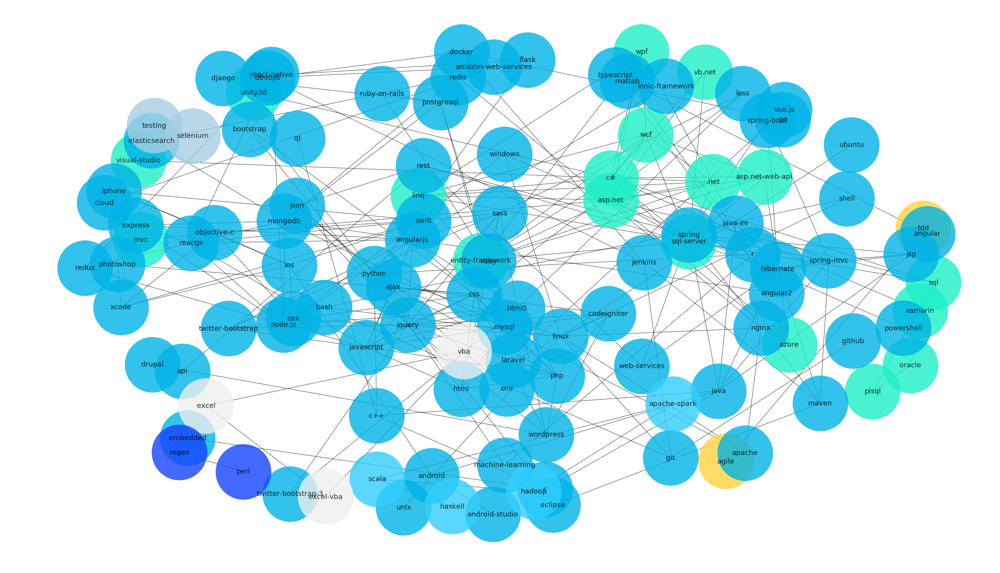

In [23]:
plot_girvan_newman(G, gn_clus[0])

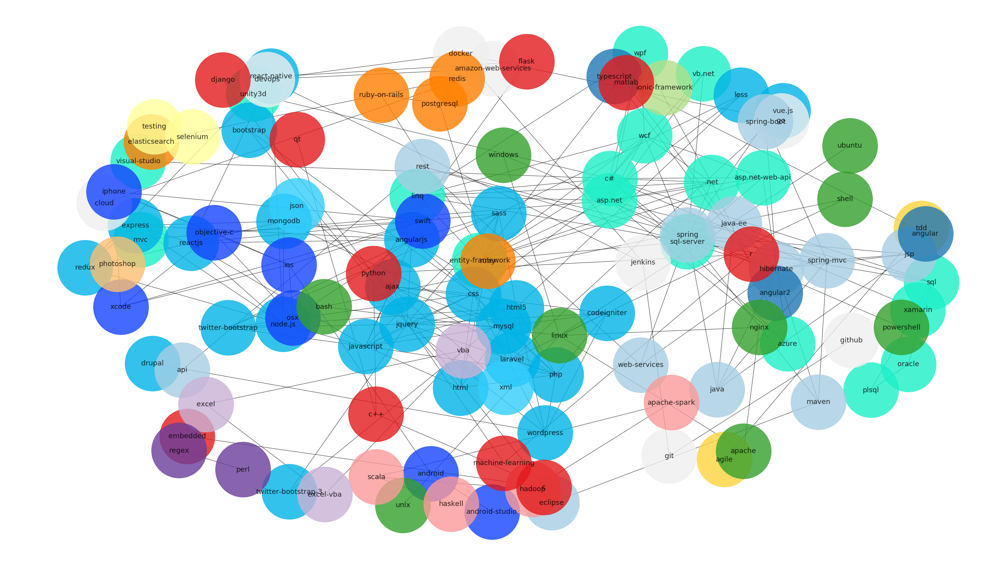

In [24]:
plot_girvan_newman(G, gn_clus[10])

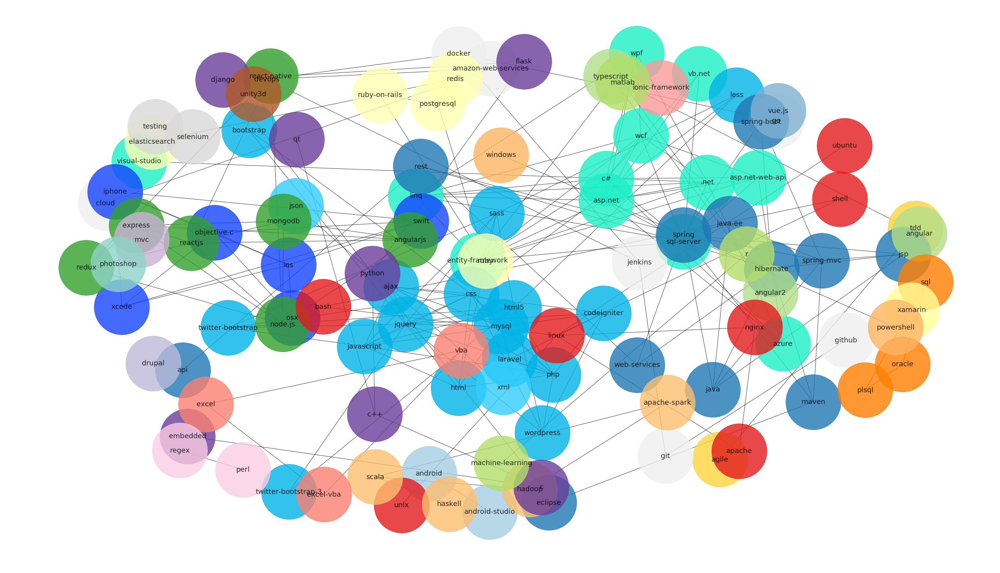

In [25]:
plot_girvan_newman(G, gn_clus[20])

## Cluster Decay Rate

Create a visual to help yourself understand the rate at which clusters of this network formed versus the number of edges removed.

> **Level-Up**: Based on your graphic, what would you predict is an appropriate number of clusters? 

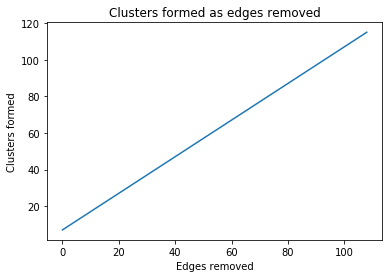

In [26]:
plt.plot(range(len(gn_clus)), [len(clus) for clus in gn_clus])
plt.title('Clusters formed as edges removed')
plt.xlabel('Edges removed')
plt.ylabel('Clusters formed')
plt.show();

## Choose a Clustering 

Now that you have generated various clusters within the overall network, which do you think is the most appropriate or informative?

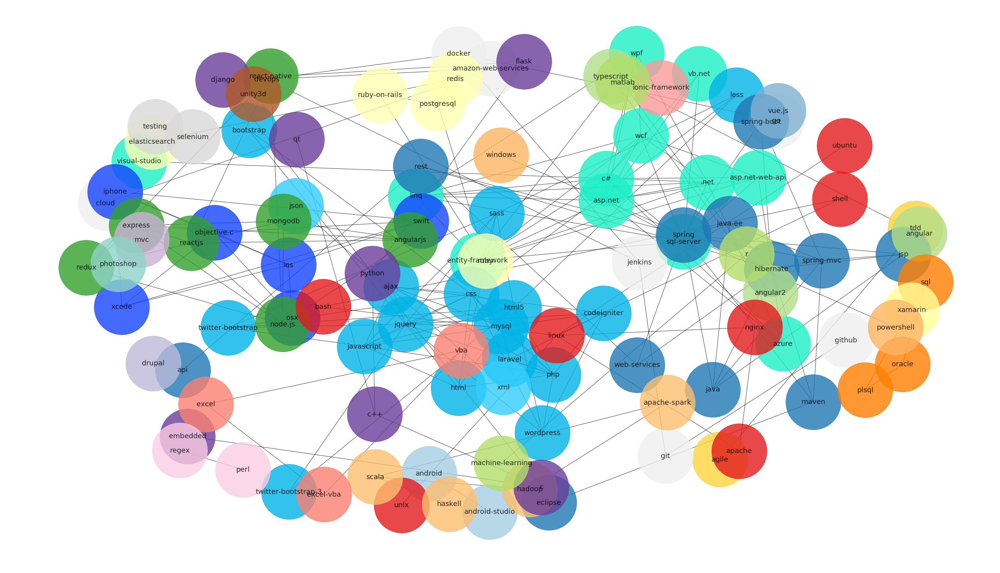

In [27]:
#Your code/response here
plot_girvan_newman(G, gn_clus[20])

## Summary

In this lab you practice using the k-clique and Girvan-Newman methods for clustering. Additionally, you may have also gotten a better sense of some of the current technological landscape. As you can start to see, network clustering provides you with powerful tools to further subset large networks into smaller constituencies allowing you to dig deeper into their particular characteristics.